<a href="https://colab.research.google.com/github/Mohamedragih1/Smoking-Status-Prediction/blob/main/Exploratory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Importing necessary libraries for data analysis and visualization**

In [ ]:
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
import itertools
sns.set(style="whitegrid")

# Ignore warnings (optional)
import warnings
warnings.filterwarnings('ignore')

# Display plots inline in the notebook
%matplotlib inline

**Generate the data according to IDs**

In [ ]:
id_1 = 7508
id_2 = 7452
id_3 = 7588
random_seed = id_1+id_2+id_3
random.seed(random_seed)
data_path="Data.csv"#replace with data path
output_path="myData.csv"#replace with output data path

all_data=pd.read_csv(data_path)
all_columns = all_data.columns.tolist()

target_column = 'smoking'

all_columns.remove(target_column)

selected_columns = random.sample(all_columns, 10)

print(selected_columns) #MUST BE PRINTED
selected_columns = np.append(selected_columns, target_column)
sample_df = all_data[selected_columns].copy()
sample_df.to_csv(output_path)   #From HERE YOU CAN SPLIT FOR TRAIN ,VALID AND TEST

['Cholesterol', 'HDL', 'triglyceride', 'serum creatinine', 'Urine protein', 'ALT', 'age', 'hemoglobin', 'id', 'dental caries']


**Univariate Analysis**

Read the data

In [ ]:
df = pd.read_csv("myData.csv", index_col = 0)
df

,Cholesterol,HDL,triglyceride,serum creatinine,Urine protein,ALT,age,hemoglobin,id,dental caries,smoking
0,172.0,40.0,300.0,1.0,1.0,25.0,55,16.5,0,0.0,1.0
1,194.0,57.0,55.0,1.1,1.0,23.0,70,16.2,1,1.0,0.0
2,178.0,45.0,197.0,0.8,1.0,31.0,20,17.4,2,0.0,1.0
3,180.0,38.0,203.0,1.0,1.0,27.0,35,15.9,3,1.0,0.0
4,155.0,44.0,87.0,0.8,1.0,13.0,30,15.4,4,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
51471,196.0,38.0,160.0,1.1,1.0,17.0,40,15.8,51471,0.0,0.0
51472,174.0,56.0,180.0,0.7,1.0,27.0,40,13.8,51472,0.0,1.0
51473,212.0,38.0,282.0,0.9,2.0,49.0,40,17.7,51473,1.0,1.0
51474,171.0,64.0,93.0,1.0,3.0,20.0,20,14.8,51474,0.0,1.0


In [ ]:
df['Urine protein'].value_counts()

1    150862
2      5609
3      2228
4       477
5        74
6         6
Name: Urine protein, dtype: int64

Drop useless features

In [ ]:
#df.drop('Unnamed: 0', axis=1, inplace=True) #This is the same as the id
df.drop('id', axis=1, inplace=True)
columns = ['Cholesterol', 'HDL', 'triglyceride', 'serum creatinine', 'Urine protein', 'ALT', 'age', 'hemoglobin','dental caries']

In [ ]:
df.describe()

,Cholesterol,HDL,triglyceride,serum creatinine,Urine protein,ALT,age,hemoglobin,dental caries,smoking
count,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000
mean,195.796165,55.852684,127.616046,0.892764,1.074233,26.550296,44.306626,14.796965,0.197996,0.437365
std,28.396959,13.964141,66.188989,0.179346,0.347856,17.753070,11.842286,1.431213,0.398490,0.496063
min,77.000000,9.000000,8.000000,0.100000,1.000000,1.000000,20.000000,4.900000,0.000000,0.000000
25%,175.000000,45.000000,77.000000,0.800000,1.000000,16.000000,40.000000,13.800000,0.000000,0.000000
50%,196.000000,54.000000,115.000000,0.900000,1.000000,22.000000,40.000000,15.000000,0.000000,0.000000
75%,217.000000,64.000000,165.000000,1.000000,1.000000,32.000000,55.000000,15.800000,0.000000,1.000000
max,393.000000,136.000000,766.000000,9.900000,6.000000,2914.000000,85.000000,21.000000,1.000000,1.000000


Split data into features and target

In [ ]:
features = df[['Cholesterol', 'HDL', 'triglyceride', 'serum creatinine', 'Urine protein', 'ALT', 'age', 'hemoglobin','dental caries']]
target = df[['smoking']]

Statistics of Features

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_temp, y_train, y_temp = train_test_split(features, target, test_size = 0.2, random_state = 42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size = 0.5, random_state = 42)


In [ ]:
X_train.describe()

,Cholesterol,HDL,triglyceride,serum creatinine,Urine protein,ALT,age,hemoglobin,dental caries
count,41179.000000,41179.000000,41179.000000,41179.000000,41179.000000,41179.000000,41180.000000,41179.000000,41179.000000
mean,195.999709,55.766944,127.684232,0.892707,1.075742,26.548168,44.353715,14.788812,0.198742
std,28.466281,13.913555,65.971352,0.178016,0.350709,20.916025,11.822109,1.429611,0.399058
min,77.000000,18.000000,8.000000,0.100000,1.000000,4.000000,4.000000,4.900000,0.000000
25%,175.000000,45.000000,77.000000,0.800000,1.000000,16.000000,40.000000,13.800000,0.000000
50%,197.000000,53.000000,115.000000,0.900000,1.000000,22.000000,40.000000,15.000000,0.000000
75%,217.000000,64.000000,165.000000,1.000000,1.000000,32.000000,55.000000,15.800000,0.000000
max,351.000000,136.000000,466.000000,5.900000,6.000000,2914.000000,85.000000,19.300000,1.000000


Univariate Analysis for numerical features using histograms, KDE and boxplot

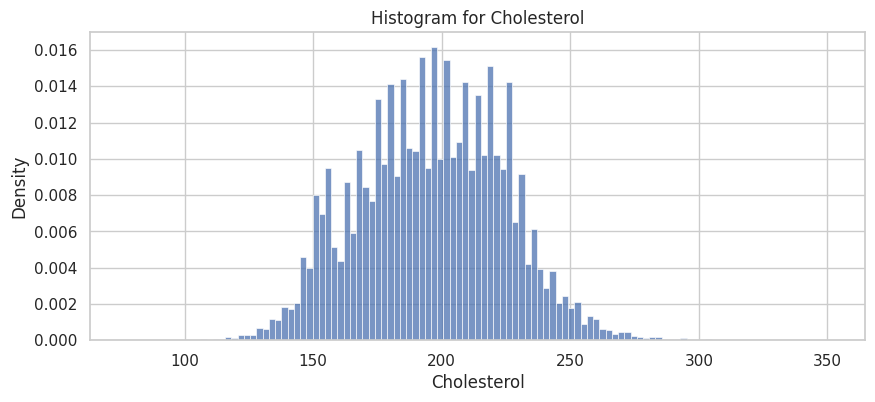

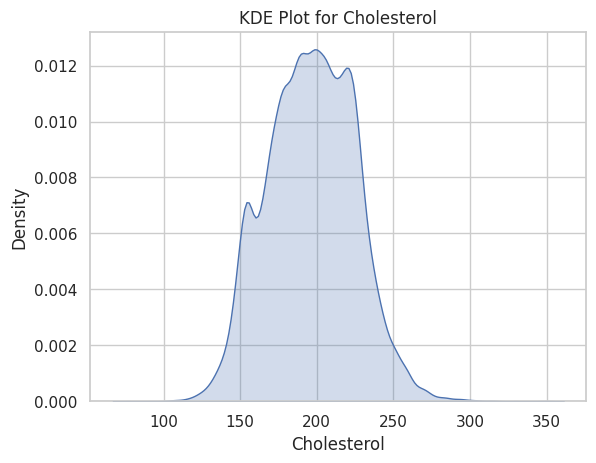

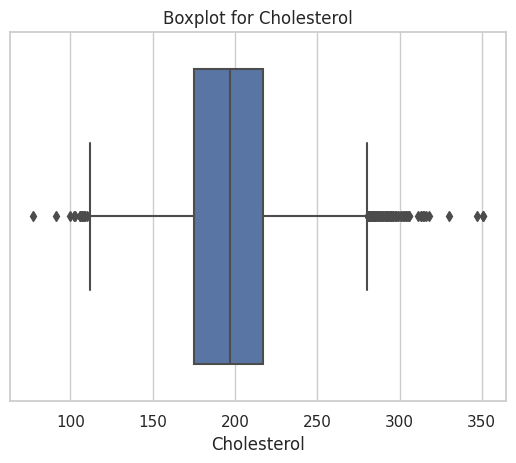

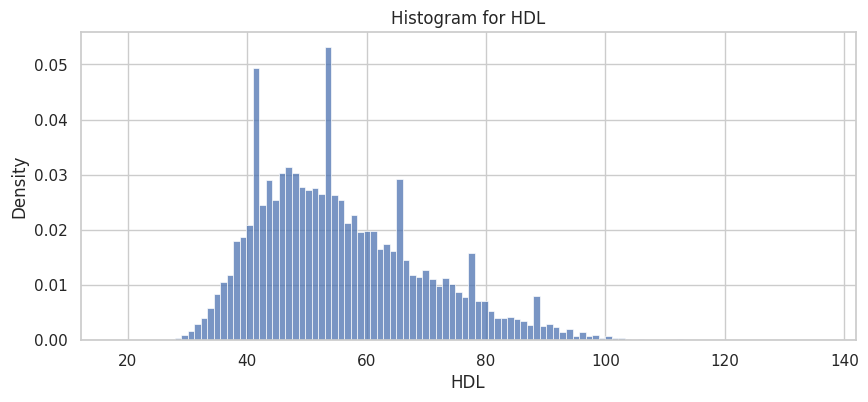

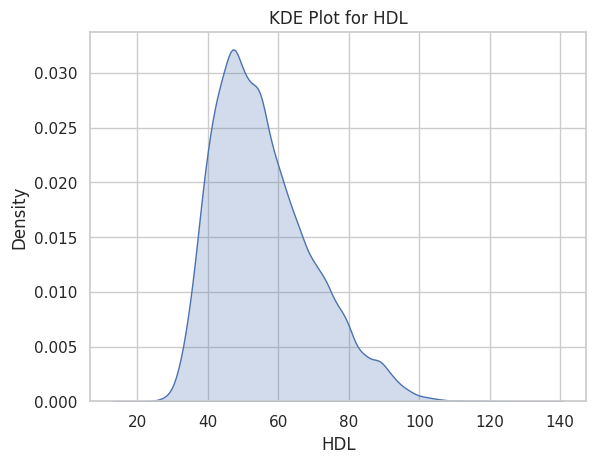

...

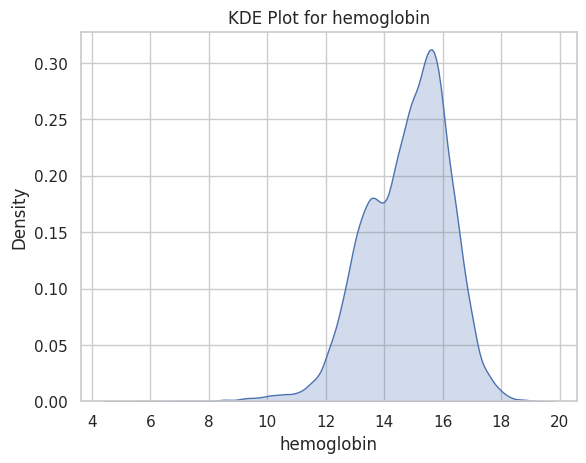

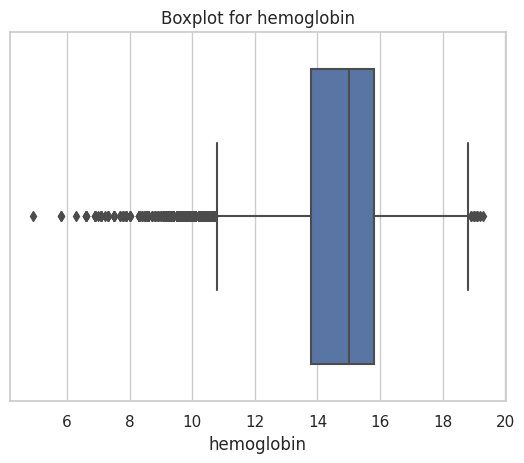

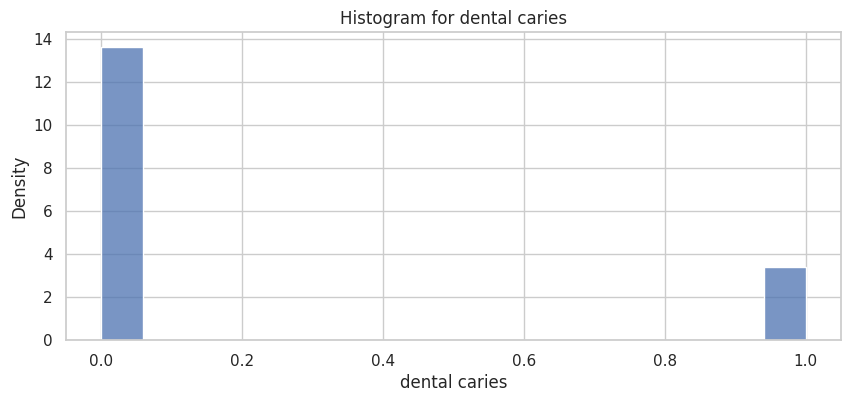

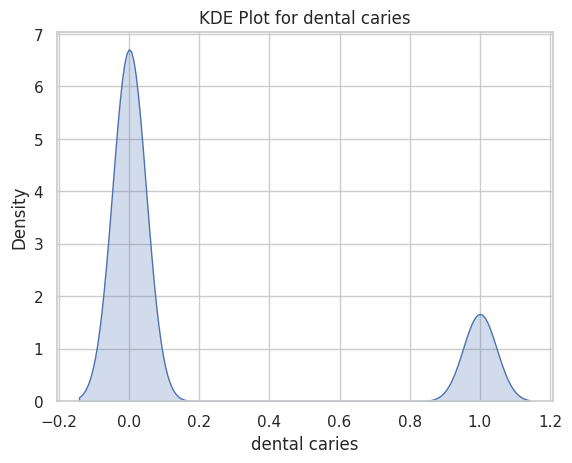

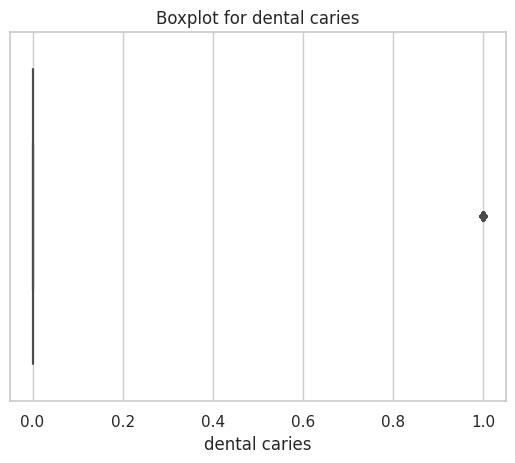

In [ ]:
sns.set(style="whitegrid")

for feature in X_train:
    plt.figure(figsize=(10, 4))

    #plt.subplot(1, 3, 1)
    sns.histplot(X_train[feature], stat='density')
    plt.title(f'Histogram for {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.show()

    #plt.subplot(1, 3, 2)
    sns.kdeplot(X_train[feature], shade = True)
    plt.title(f'KDE Plot for {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.show()

    #plt.subplot(1, 3, 3)
    sns.boxplot(x=X_train[feature])
    plt.title(f'Boxplot for {feature}')
    plt.xlabel(feature)
    plt.show()


In [ ]:
numerical_columns = ['Cholesterol', 'HDL', 'triglyceride', 'serum creatinine', 'ALT', 'age', 'hemoglobin']
for column in numerical_columns:
 df['column_name'].fillna(df['column_name'].mean(), inplace=True)

Cholesterol
0.0595316650557737


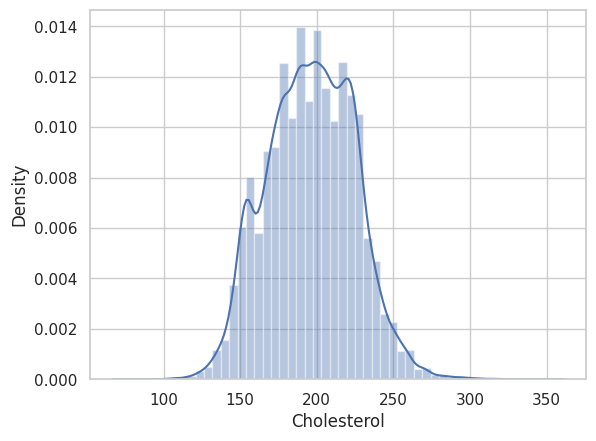

HDL
0.7696551719234073


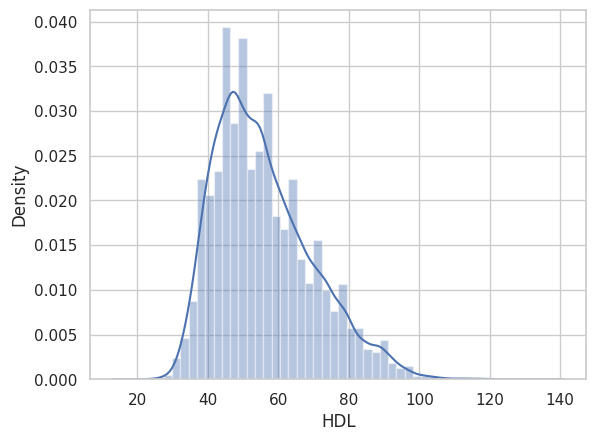

triglyceride
0.9770094678493056


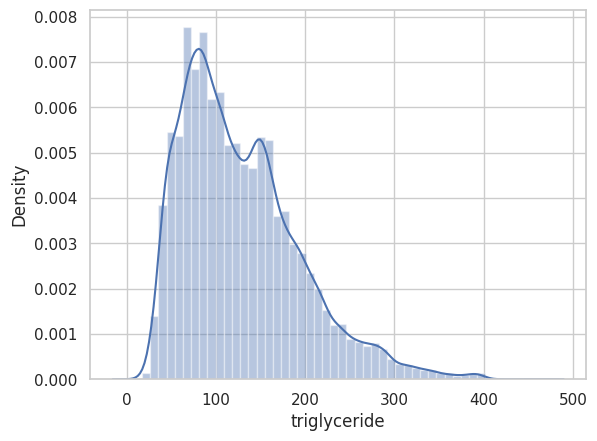

serum creatinine
0.6763789877641245


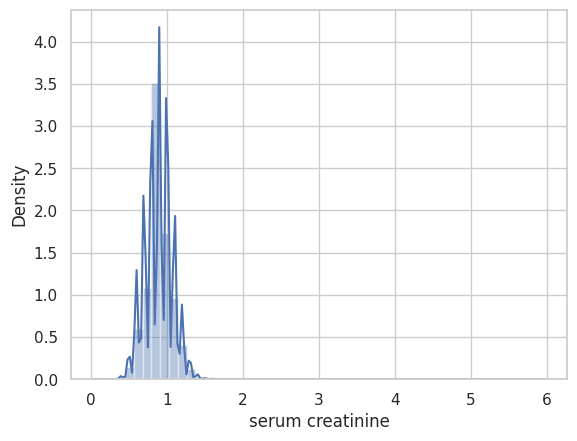

ALT
64.85512138972909


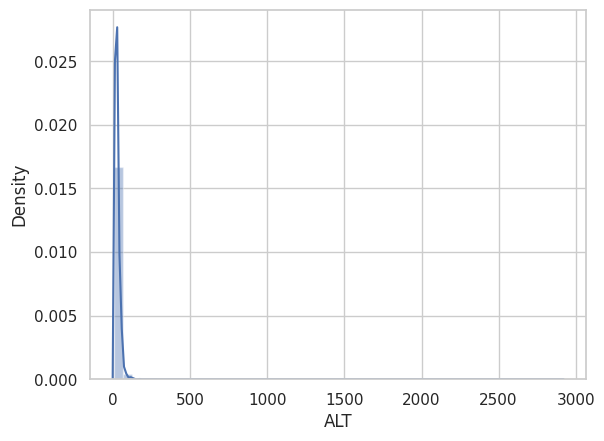

age
0.28759756180479357


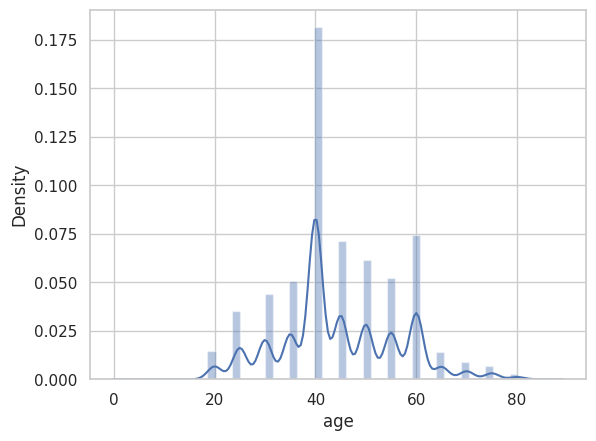

hemoglobin
-0.6477379327616639


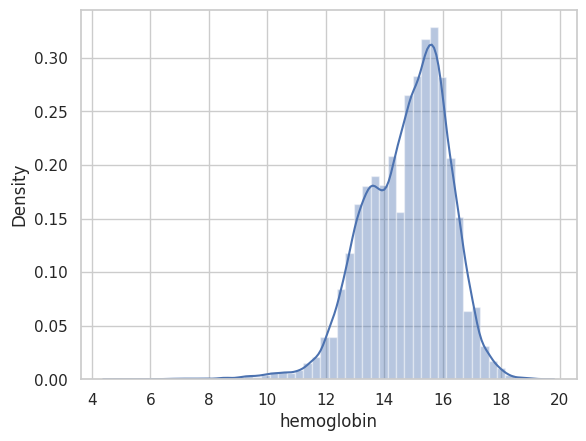

{'Cholesterol': 0.0595316650557737, 'HDL': 0.7696551719234073, 'triglyceride': 0.9770094678493056, 'serum creatinine': 0.6763789877641245, 'ALT': 64.85512138972909, 'age': 0.28759756180479357, 'hemoglobin': -0.6477379327616639}


In [ ]:
numerical_columns = ['Cholesterol', 'HDL', 'triglyceride', 'serum creatinine', 'ALT', 'age', 'hemoglobin']
skewness = {}
for column in numerical_columns:
  print(column)
  median_value = X_train[column].median()
  column_data = X_train[column].fillna(median_value)
  print(skew(column_data))
  skewness[column] = skew(column_data)
  plt.figure()
  sns.distplot(column_data)
  plt.show()
print(skewness)

**Bivariate Analysis**

Identifying Correlation

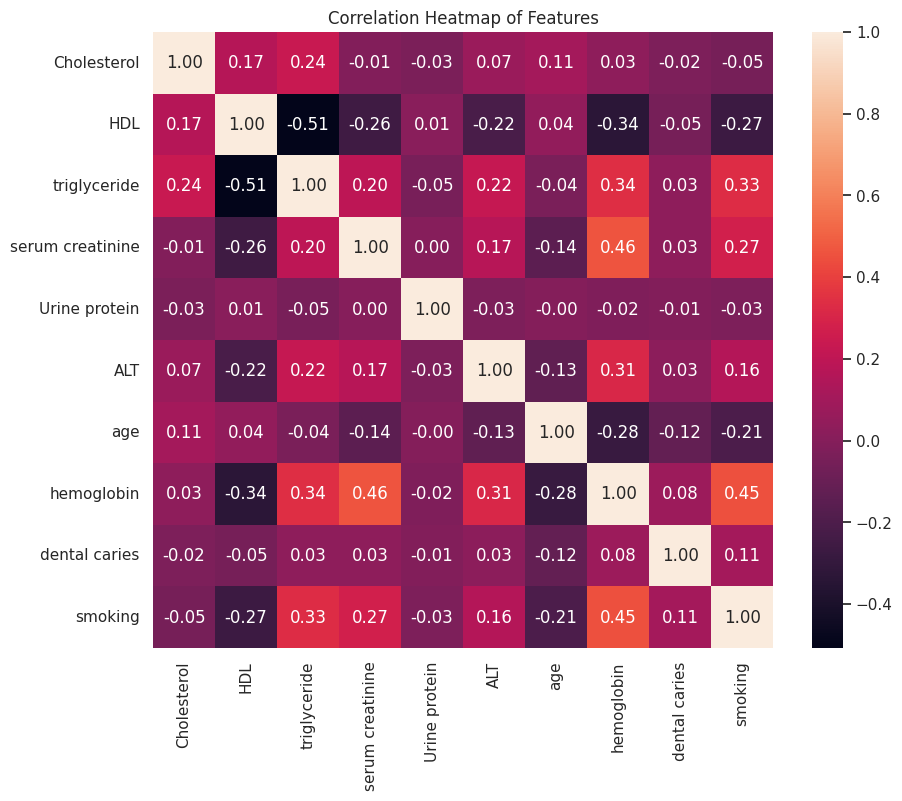

In [ ]:
corr_matrix = df.corr()

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
# sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
sns.heatmap(corr_matrix, annot=True, fmt='.2f')
plt.title('Correlation Heatmap of Features')
plt.show()

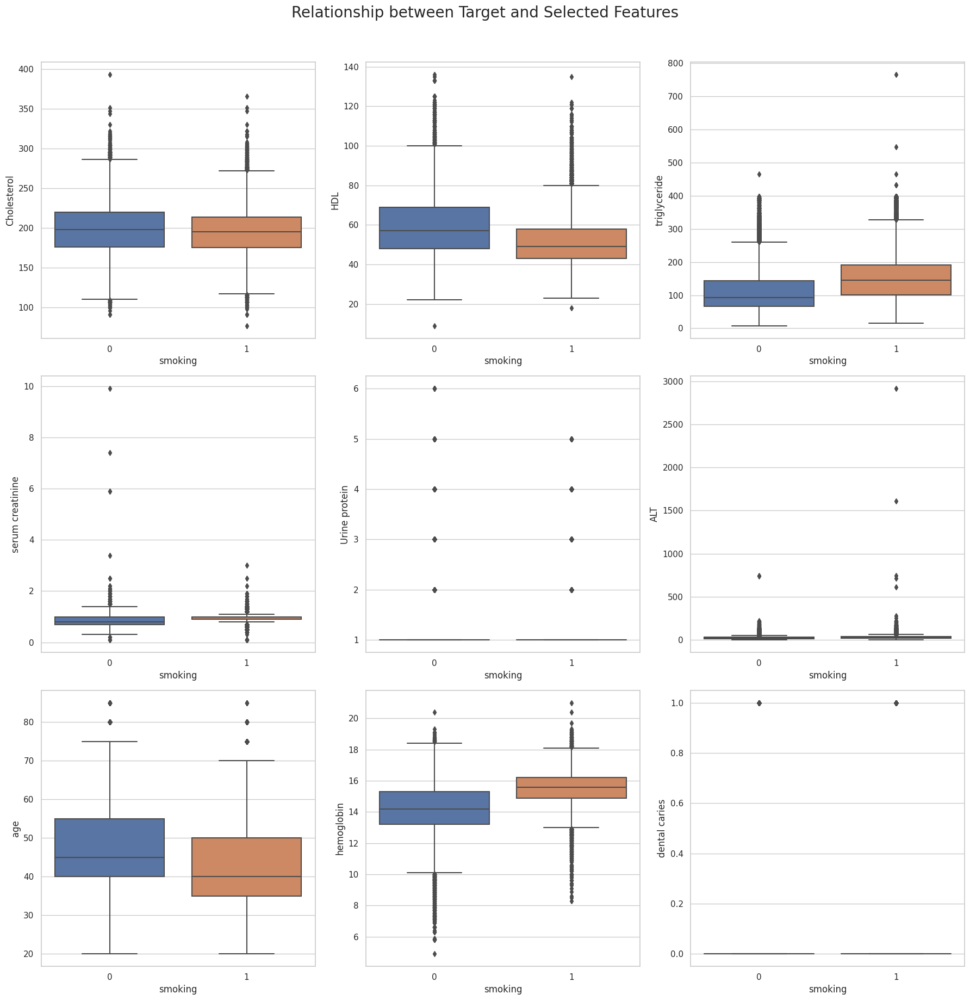

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 18))
for i, feature in enumerate(columns[:-1]):
    sns.boxplot(x=df[target_column], y=df[feature], ax=axes[i // 3, i % 3])

fig.suptitle("Relationship between Target and Selected Features", y=1.02, fontsize=20)
plt.tight_layout()
plt.show()

**Multivariante analysis**

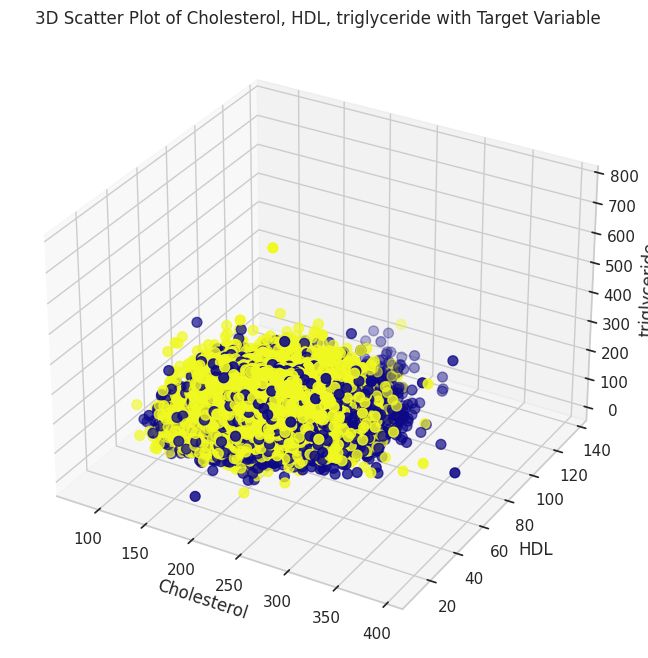

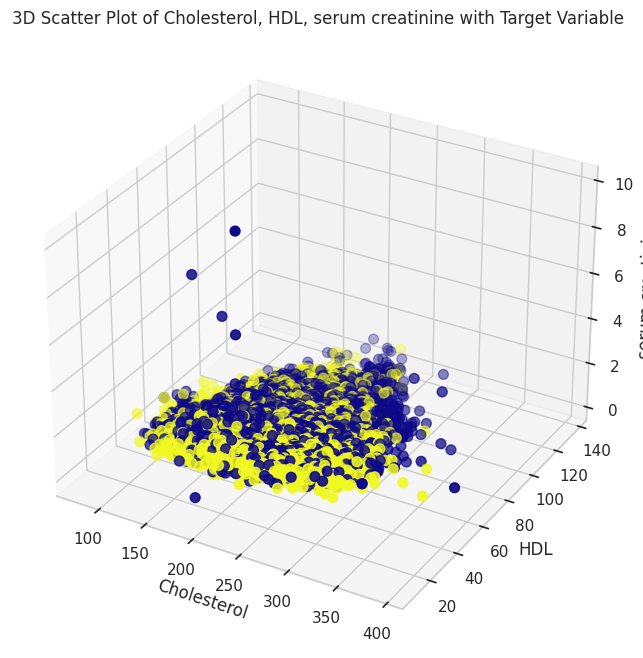

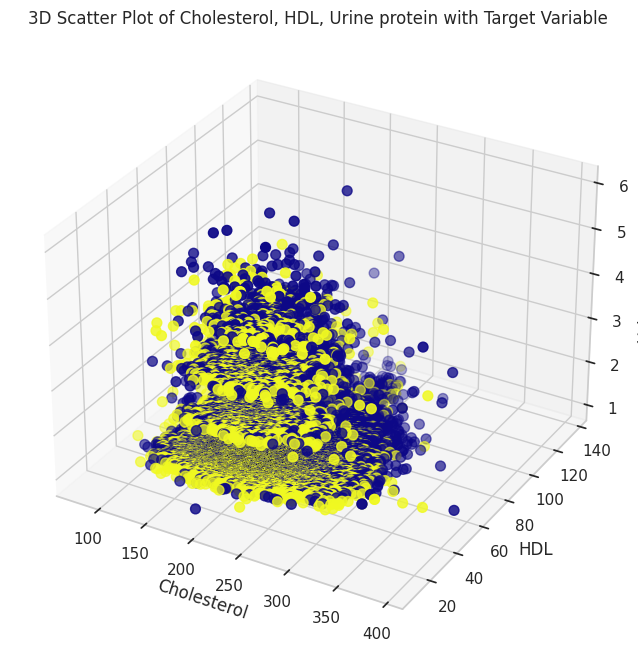

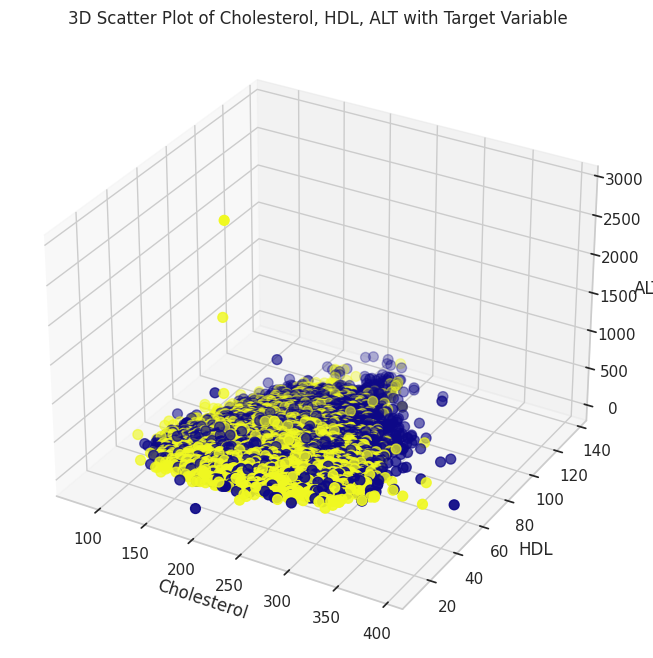

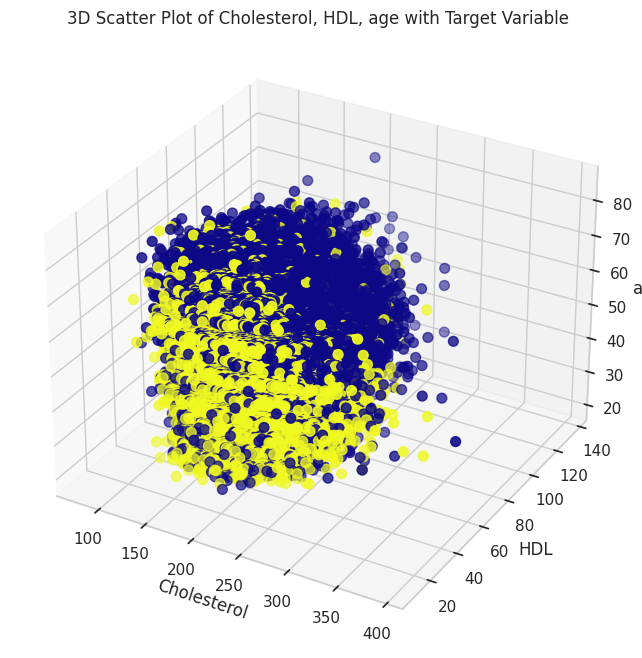

...

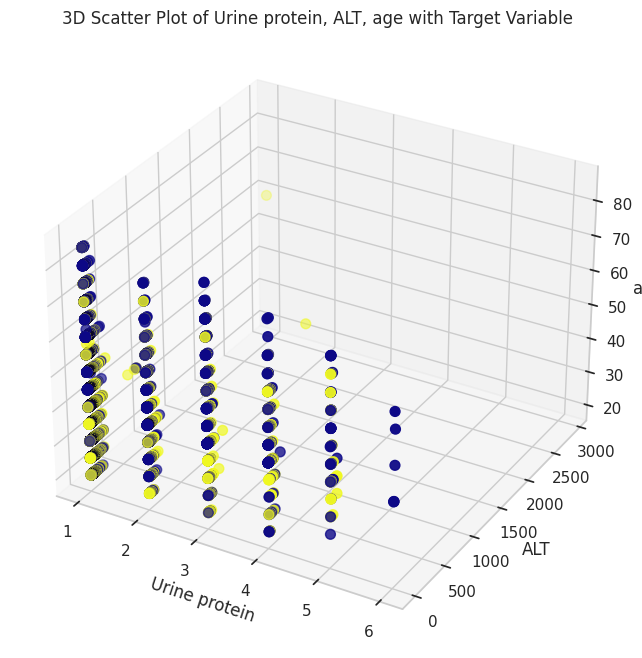

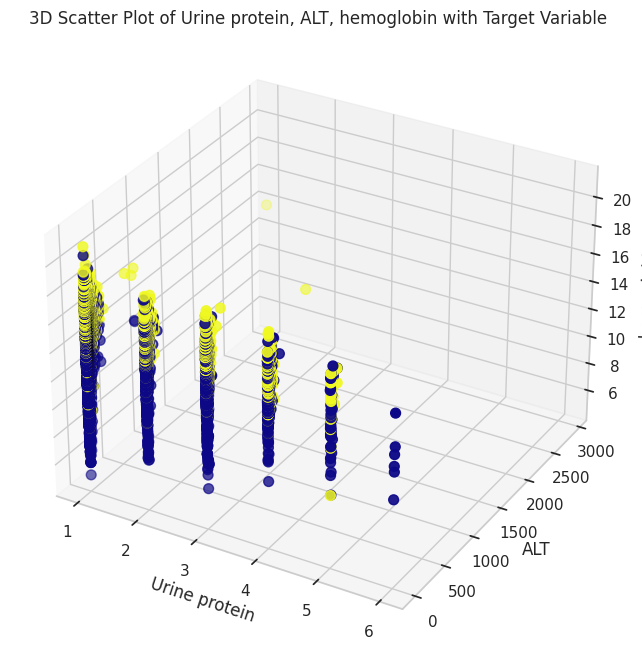

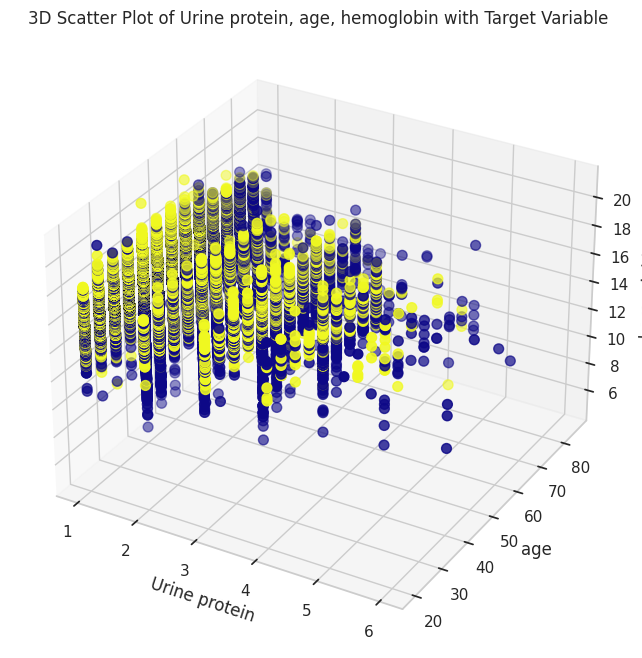

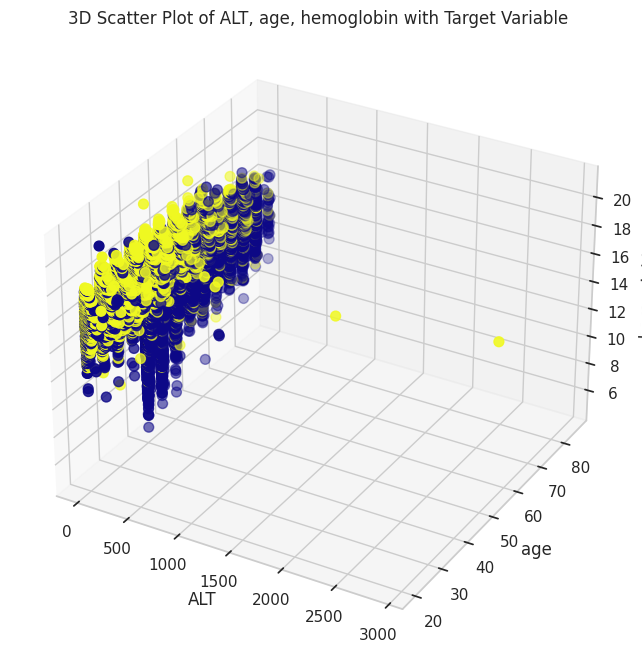

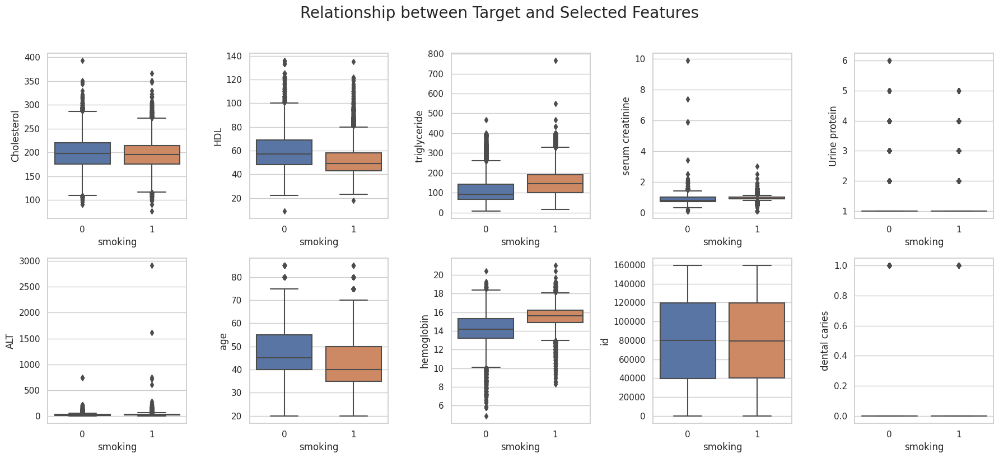

In [ ]:
feature_combinations = list(itertools.combinations(columns[:-1], 3))

for combination in feature_combinations:
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    x, y, z = combination
    ax.scatter(df[x], df[y], df[z], c=df[target_column], cmap='plasma', s=50)

    ax.set_xlabel(x)
    ax.set_ylabel(y)
    ax.set_zlabel(z)
    ax.set_title(f"3D Scatter Plot of {x}, {y}, {z} with Target Variable")
    plt.show()


# Relationship between Target and Selected Features
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(18, 8))

for i, feature in enumerate(selected_columns[:-1]):
    sns.boxplot(x=df[target_column], y=df[feature], ax=axes[i // 5, i % 5])

fig.suptitle("Relationship between Target and Selected Features", y=1.02, fontsize=20)
plt.tight_layout()
plt.show()

##feature engineering

In [ ]:
sqrt_transformed_data = np.sqrt(original_data)

# Apply logarithmic transformation
log_transformed_data = np.log(original_data)